In [15]:
import cv2
import numpy as np
import random
import matplotlib.pyplot as plt
%matplotlib inline

import re
import os
import os.path
import glob
from PIL import Image
from skimage import io

from sklearn.preprocessing import LabelEncoder
from keras.utils import np_utils

from keras.models import Sequential,Model
from keras.layers import Input,Flatten,Dense,Dropout,GlobalAveragePooling2D,Conv2D,MaxPooling2D
from keras.preprocessing.image import img_to_array
from keras.preprocessing import image
from vis.utils import utils
from keras.applications import VGG16
from vis.visualization import visualize_cam,visualize_saliency, overlay

# Disable GPU
os.environ['CUDA_VISIBLE_DEVICES'] = '-1'

In [2]:
imagedir = "Datasets/malimg_paper_dataset_imgs"

In [3]:
cur_dir = os.getcwd()
os.chdir(imagedir)  # the parent folder with sub-folders

# Get number of samples per family
list_fams = sorted(os.listdir(os.getcwd()), key=str.lower)  # vector of strings with family names
no_imgs = []  # No. of samples per family
for i in range(len(list_fams)):
    os.chdir(list_fams[i])
    len1 = len(glob.glob('*.png'))  # assuming the images are stored as 'png'
    no_imgs.append(len1)
    os.chdir('..')
num_samples = np.sum(no_imgs)  # total number of all samples

# Compute the labels
y = np.zeros(num_samples)
pos = 0
label = 0
for i in no_imgs:
    print ("Label:%2d\tFamily: %15s\tNumber of images: %d" % (label, list_fams[label], i))
    for j in range(i):
        y[pos] = label
        pos += 1
    label += 1
num_classes = label

# Compute the features
width, height,channels = (224,224,3)
X = np.zeros((num_samples, width, height, channels))
cnt = 0
list_paths = [] # List of image paths
print("Processing images ...")
for i in range(len(list_fams)):
    for img_file in image.list_pictures(list_fams[i], ext='jpg|jpeg|bmp|png'):
        #print("[%d] Processing image: %s" % (cnt, img_file))
        list_paths.append(os.path.join(os.getcwd(),img_file))
        img = image.load_img(img_file, target_size=(224, 224))
        x = image.img_to_array(img)
        x = np.expand_dims(x, axis=0)
        X[cnt] = x
        #x /= 255
        #x = preprocess_input(x)
        #X[cnt] = np.array(x).reshape(width*height*channels)
        cnt += 1
print("Images processed: %d" %(cnt))

os.chdir(cur_dir)

Label: 0	Family:       Adialer.C	Number of images: 122
Label: 1	Family:       Agent.FYI	Number of images: 116
Label: 2	Family:       Allaple.A	Number of images: 2949
Label: 3	Family:       Allaple.L	Number of images: 1591
Label: 4	Family:   Alueron.gen!J	Number of images: 198
Label: 5	Family:       Autorun.K	Number of images: 106
Label: 6	Family:     C2LOP.gen!g	Number of images: 200
Label: 7	Family:         C2LOP.P	Number of images: 146
Label: 8	Family:  Dialplatform.B	Number of images: 177
Label: 9	Family:       Dontovo.A	Number of images: 162
Label:10	Family:        Fakerean	Number of images: 381
Label:11	Family:   Instantaccess	Number of images: 431
Label:12	Family:      Lolyda.AA1	Number of images: 213
Label:13	Family:      Lolyda.AA2	Number of images: 184
Label:14	Family:      Lolyda.AA3	Number of images: 123
Label:15	Family:       Lolyda.AT	Number of images: 159
Label:16	Family:     Malex.gen!J	Number of images: 136
Label:17	Family:   Obfuscator.AD	Number of images: 142
Label:18

In [4]:
# Encoding classes (y) into integers (y_encoded) and then generating one-hot-encoding (Y)
encoder = LabelEncoder()
encoder.fit(y)
y_encoded = encoder.transform(y)
Y = np_utils.to_categorical(y_encoded)

In [5]:
# Creating base model (VGG16 convolutional layers)
img_shape = (224, 224, 3)                                                                                                                                               
model = Sequential()

# Block 1
model.add(Conv2D(64, (3, 3), activation='relu', padding='same', name='block1_conv1', input_shape=img_shape))
model.add(Conv2D(64, (3, 3), activation='relu', padding='same', name='block1_conv2'))
model.add(MaxPooling2D((2, 2), strides=(2, 2), name='block1_pool'))

# Block 2
model.add(Conv2D(128, (3, 3), activation='relu', padding='same', name='block2_conv1'))
model.add(Conv2D(128, (3, 3), activation='relu', padding='same', name='block2_conv2'))
model.add(MaxPooling2D((2, 2), strides=(2, 2), name='block2_pool'))

# Block 3
model.add(Conv2D(256, (3, 3), activation='relu', padding='same', name='block3_conv1'))
model.add(Conv2D(256, (3, 3), activation='relu', padding='same', name='block3_conv2'))
model.add(Conv2D(256, (3, 3), activation='relu', padding='same', name='block3_conv3'))
model.add(MaxPooling2D((2, 2), strides=(2, 2), name='block3_pool'))

# Block 4
model.add(Conv2D(512, (3, 3), activation='relu', padding='same', name='block4_conv1'))
model.add(Conv2D(512, (3, 3), activation='relu', padding='same', name='block4_conv2'))
model.add(Conv2D(512, (3, 3), activation='relu', padding='same', name='block4_conv3'))
model.add(MaxPooling2D((2, 2), strides=(2, 2), name='block4_pool'))

# Block 5
model.add(Conv2D(512, (3, 3), activation='relu', padding='same', name='block5_conv1'))
model.add(Conv2D(512, (3, 3), activation='relu', padding='same', name='block5_conv2'))
model.add(Conv2D(512, (3, 3), activation='relu', padding='same', name='block5_conv3'))
model.add(MaxPooling2D((2, 2), strides=(2, 2), name='block5_pool'))

In [6]:
vgg16weights = "vgg16_weights_tf_dim_ordering_tf_kernels.h5"
model.load_weights(vgg16weights, by_name=True)

In [7]:
# Stacking top model (fc and softmax layers)
model.add(Flatten())                                                
model.add(Dense(160, activation='relu', name='fc1'))
model.add(Dropout(0.4))                
model.add(Dense(160, activation='relu', name='fc2'))
model.add(Dropout(0.4))              
model.add(Dense(num_classes, activation='softmax', name='predictions'))                             

In [8]:
top_weigths = "top_model-weights-max_val_acc-mlp-vgg16-2layers-160neurons-relu-0.4dropout-Adam-500epochs.h5"
model.load_weights(top_weigths, by_name=True)

In [9]:
model.compile(optimizer='Adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [10]:
# The name of the layer we want to visualize
layer_name = 'predictions'
layer_idx = [idx for idx, layer in enumerate(model.layers) if layer.name == layer_name][0]

Family: Adialer.C
Image: ['05c1a8d78ab2ffd674b1edce0e51a0b3.png'] - Class: ['Adialer.C'] - Pred: 0 (Adialer.C)
Image: ['0510f72bdb5ef6f20e6eb38755c358fb.png'] - Class: ['Adialer.C'] - Pred: 0 (Adialer.C)
Image: ['0507a1034a8e029220bcd616fe903074.png'] - Class: ['Adialer.C'] - Pred: 0 (Adialer.C)
Image: ['0389aa150d48d505aa0d846ee51ad87f.png'] - Class: ['Adialer.C'] - Pred: 0 (Adialer.C)
Image: ['088aafd35283b3e2d386f118edf3d5a5.png'] - Class: ['Adialer.C'] - Pred: 0 (Adialer.C)


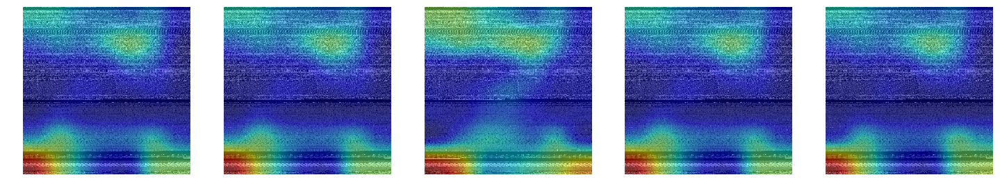

Family: Agent.FYI
Image: ['00679e84b63d3dc1ba3327fbb6f0dfac.png'] - Class: ['Agent.FYI'] - Pred: 1 (Agent.FYI)
Image: ['00398a7dc12d49b8334b70b1046a42a4.png'] - Class: ['Agent.FYI'] - Pred: 1 (Agent.FYI)
Image: ['00d2cd2b9c97b5208ee023118ca80976.png'] - Class: ['Agent.FYI'] - Pred: 1 (Agent.FYI)
Image: ['006f1f7413ccb99e090ec9a51c312f1e.png'] - Class: ['Agent.FYI'] - Pred: 1 (Agent.FYI)
Image: ['000a1342fec96ebc38965897331dbcdb.png'] - Class: ['Agent.FYI'] - Pred: 1 (Agent.FYI)


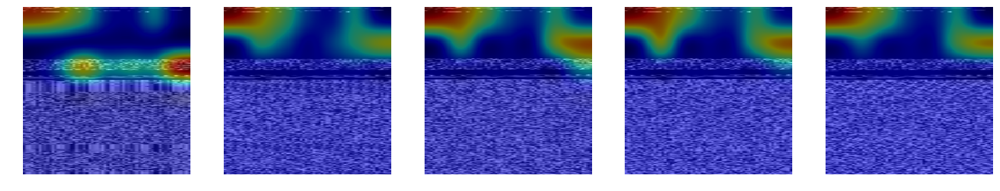

Family: Allaple.A
Image: ['06db182c43d50c028aad3f05a53dfd0f.png'] - Class: ['Allaple.A'] - Pred: 2 (Allaple.A)
Image: ['042f59eb5e2e16802e047fb03a8c99ab.png'] - Class: ['Allaple.A'] - Pred: 2 (Allaple.A)
Image: ['08756257335a520ef376929fadeaea75.png'] - Class: ['Allaple.A'] - Pred: 2 (Allaple.A)
Image: ['04bb721b2df1de898bbd90beb202afff.png'] - Class: ['Allaple.A'] - Pred: 2 (Allaple.A)
Image: ['044517e577ac70563b8d2856bb1d36e0.png'] - Class: ['Allaple.A'] - Pred: 2 (Allaple.A)


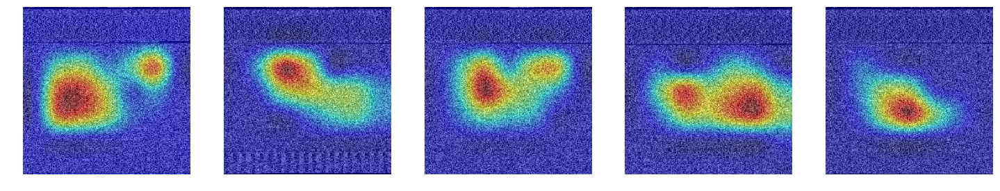

Family: Allaple.L
Image: ['044d64dc2bb410c286d5a4f137821ec8.png'] - Class: ['Allaple.L'] - Pred: 3 (Allaple.L)
Image: ['065d1f12c517c06d5a510c100c9b6ed6.png'] - Class: ['Allaple.L'] - Pred: 3 (Allaple.L)
Image: ['0079027ddc234500a62201105afb2f25.png'] - Class: ['Allaple.L'] - Pred: 3 (Allaple.L)
Image: ['0673facdfa5020744483cc18808dfad6.png'] - Class: ['Allaple.L'] - Pred: 3 (Allaple.L)
Image: ['056810fa05b3202f199e3f10cab2ac0a.png'] - Class: ['Allaple.L'] - Pred: 3 (Allaple.L)


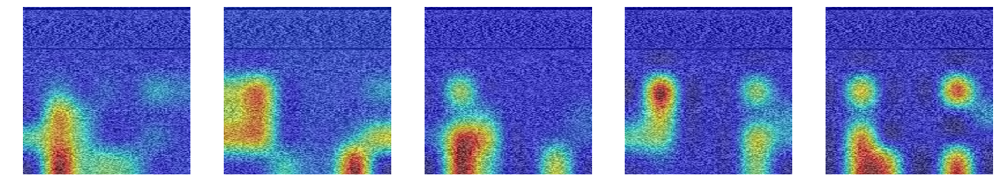

Family: Alueron.gen!J
Image: ['0312b32472ce0e9404b78301c3cd7ac6.png'] - Class: ['Alueron.gen!J'] - Pred: 4 (Alueron.gen!J)
Image: ['008ac1c70a2dffebee51b994e21a9933.png'] - Class: ['Alueron.gen!J'] - Pred: 4 (Alueron.gen!J)
Image: ['066a4eb402259a22dc17a6bec3ab77f3.png'] - Class: ['Alueron.gen!J'] - Pred: 4 (Alueron.gen!J)
Image: ['0195bc49e39a8fbd455e20abc8ae1e94.png'] - Class: ['Alueron.gen!J'] - Pred: 4 (Alueron.gen!J)
Image: ['0077c1ae9da82391446d3c7db38b74bc.png'] - Class: ['Alueron.gen!J'] - Pred: 4 (Alueron.gen!J)


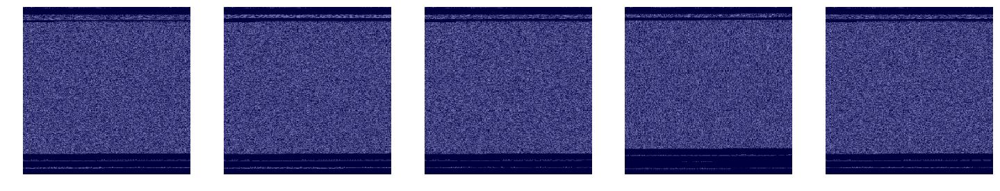

Family: Autorun.K
Image: ['053e84dd4fe04a5584116c892363dca4.png'] - Class: ['Autorun.K'] - Pred: 24 (Yuner.A)
Image: ['088d1644ef5d130484b55b8d59ad79f9.png'] - Class: ['Autorun.K'] - Pred: 24 (Yuner.A)
Image: ['0771278172c09f745961c8501dbf79b1.png'] - Class: ['Autorun.K'] - Pred: 24 (Yuner.A)
Image: ['0745c49b810c1e6347da9758ff06ad9a.png'] - Class: ['Autorun.K'] - Pred: 24 (Yuner.A)
Image: ['086c42b84cc993dec082a032940890d0.png'] - Class: ['Autorun.K'] - Pred: 24 (Yuner.A)


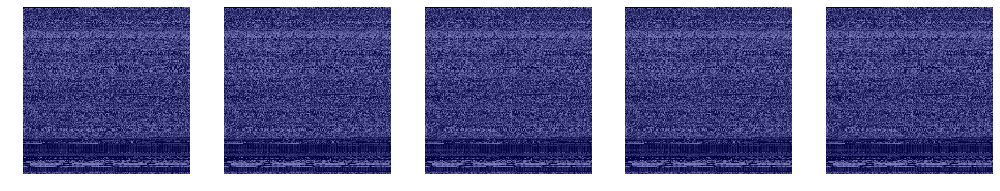

Family: C2LOP.gen!g
Image: ['06e7fe12182084824dacff261d9f32d2.png'] - Class: ['C2LOP.gen!g'] - Pred: 6 (C2LOP.gen!g)
Image: ['0025ce5f90bf63edd9edf195c69a2d8c.png'] - Class: ['C2LOP.gen!g'] - Pred: 6 (C2LOP.gen!g)
Image: ['0312af51d4e0631cf7140918763d9258.png'] - Class: ['C2LOP.gen!g'] - Pred: 6 (C2LOP.gen!g)
Image: ['0600530f3ea6d381e8d5f461e4b9047e.png'] - Class: ['C2LOP.gen!g'] - Pred: 6 (C2LOP.gen!g)
Image: ['00f6dc799d218084e95e13643223b7d0.png'] - Class: ['C2LOP.gen!g'] - Pred: 6 (C2LOP.gen!g)


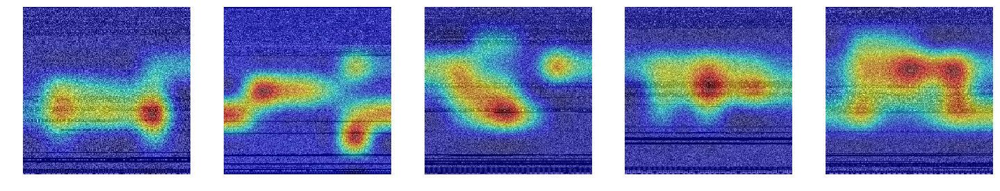

Family: C2LOP.P
Image: ['00f2f382bed43b045d8773eb72efc3e1.png'] - Class: ['C2LOP.P'] - Pred: 7 (C2LOP.P)
Image: ['00d07c82622565c1b28055b70138d42c.png'] - Class: ['C2LOP.P'] - Pred: 7 (C2LOP.P)
Image: ['00441ac78c8851bfcfab81d9bc9c2d2a.png'] - Class: ['C2LOP.P'] - Pred: 7 (C2LOP.P)
Image: ['01a7d7c580a9fb7beaa7a118fa55566a.png'] - Class: ['C2LOP.P'] - Pred: 7 (C2LOP.P)
Image: ['05bf7d4afb4e41d58bb6aa8e77f2995c.png'] - Class: ['C2LOP.P'] - Pred: 7 (C2LOP.P)


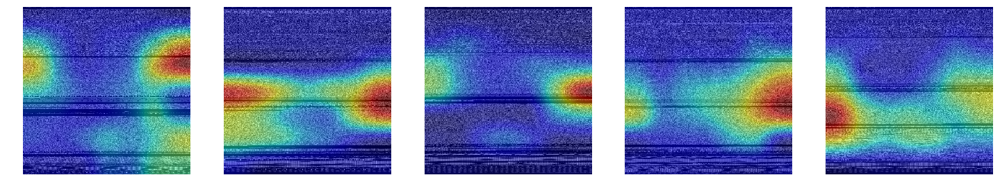

Family: Dialplatform.B
Image: ['008f2ada8d98c6ec0077fc8cad59ebd5.png'] - Class: ['Dialplatform.B'] - Pred: 8 (Dialplatform.B)
Image: ['04438c9dc0697eb73d40a7a64e891a00.png'] - Class: ['Dialplatform.B'] - Pred: 8 (Dialplatform.B)
Image: ['01dad13d5667855d8a0c3373d46900f5.png'] - Class: ['Dialplatform.B'] - Pred: 8 (Dialplatform.B)
Image: ['0866008d9f56a0ee118f09927075f9d4.png'] - Class: ['Dialplatform.B'] - Pred: 8 (Dialplatform.B)
Image: ['0225cc7044066dfe0e4a5ea577a833ee.png'] - Class: ['Dialplatform.B'] - Pred: 8 (Dialplatform.B)


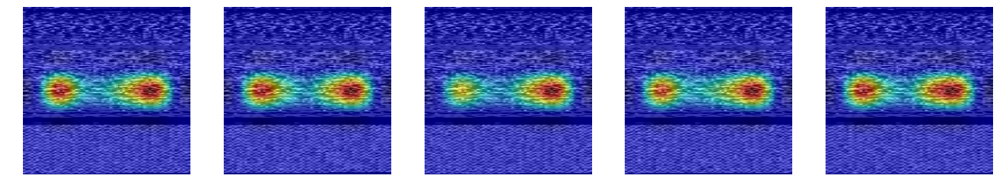

Family: Dontovo.A
Image: ['003c8bac4de429e026046af2107942a5.png'] - Class: ['Dontovo.A'] - Pred: 9 (Dontovo.A)
Image: ['04cd530f42e45bf92a216bf4b27f06d5.png'] - Class: ['Dontovo.A'] - Pred: 9 (Dontovo.A)
Image: ['0359f055545c068bf2bbfc686a87fca8.png'] - Class: ['Dontovo.A'] - Pred: 9 (Dontovo.A)
Image: ['0383c95ca595cdda9e479cadbac72256.png'] - Class: ['Dontovo.A'] - Pred: 9 (Dontovo.A)
Image: ['071e4058c4ff83fdce5300715f70f595.png'] - Class: ['Dontovo.A'] - Pred: 9 (Dontovo.A)


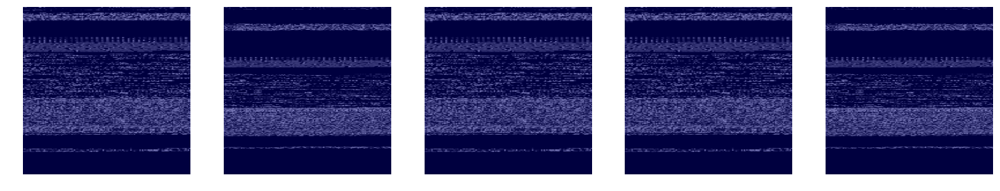

Family: Fakerean
Image: ['00ecd9ba6b704794284eb34ff5510ec2.png'] - Class: ['Fakerean'] - Pred: 10 (Fakerean)
Image: ['001b2d12abaa0c767d67144b9fff5491.png'] - Class: ['Fakerean'] - Pred: 10 (Fakerean)
Image: ['07e629351ff4d28da6d90036030cc5a0.png'] - Class: ['Fakerean'] - Pred: 10 (Fakerean)
Image: ['062b77048bb5cb1bd0dedc851e9d4f3b.png'] - Class: ['Fakerean'] - Pred: 10 (Fakerean)
Image: ['07af1d8941c0df9694195ef0e70b255d.png'] - Class: ['Fakerean'] - Pred: 10 (Fakerean)


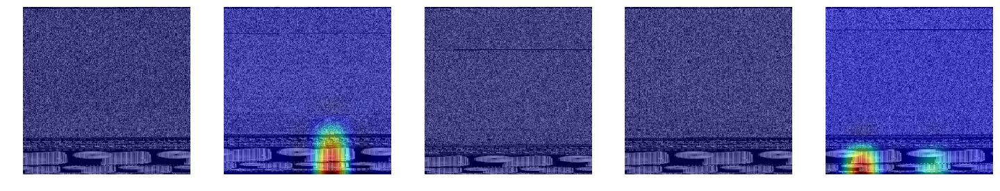

Family: Instantaccess
Image: ['03aedf7f6b538f804b8df92086fab110.png'] - Class: ['Instantaccess'] - Pred: 11 (Instantaccess)
Image: ['05d28416083494534a5f9dcdaba801b7.png'] - Class: ['Instantaccess'] - Pred: 11 (Instantaccess)
Image: ['06b3103bbf7442e7111fac766a93a725.png'] - Class: ['Instantaccess'] - Pred: 11 (Instantaccess)
Image: ['00b36384ef6f1f079737532546792ec3.png'] - Class: ['Instantaccess'] - Pred: 11 (Instantaccess)
Image: ['02fa3af51b46b13ac161f6353b7a8c5d.png'] - Class: ['Instantaccess'] - Pred: 11 (Instantaccess)


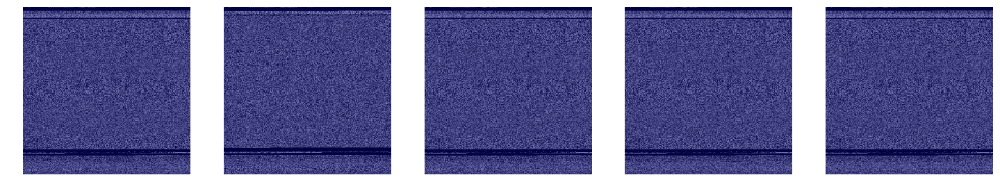

Family: Lolyda.AA1
Image: ['0039765c7de47c9050e2fea280d03710.png'] - Class: ['Lolyda.AA1'] - Pred: 12 (Lolyda.AA1)
Image: ['00ac1480d86762d63958ba90ca90e2bd.png'] - Class: ['Lolyda.AA1'] - Pred: 12 (Lolyda.AA1)
Image: ['000d4092247b1bdc5731047cad3ed877.png'] - Class: ['Lolyda.AA1'] - Pred: 12 (Lolyda.AA1)
Image: ['004be1788885f7a368453a90fb83ebec.png'] - Class: ['Lolyda.AA1'] - Pred: 12 (Lolyda.AA1)
Image: ['00c5a590a6e342893dba5fb888527c19.png'] - Class: ['Lolyda.AA1'] - Pred: 12 (Lolyda.AA1)


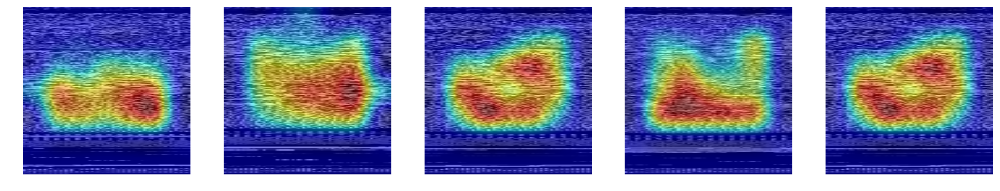

Family: Lolyda.AA2
Image: ['00c0330e59a68713b721f041f56e1a08.png'] - Class: ['Lolyda.AA2'] - Pred: 13 (Lolyda.AA2)
Image: ['00c0d346e3666f39b2ba46957dfa96e0.png'] - Class: ['Lolyda.AA2'] - Pred: 13 (Lolyda.AA2)
Image: ['004947b73b3caa0bd65fb3d5284a4b15.png'] - Class: ['Lolyda.AA2'] - Pred: 13 (Lolyda.AA2)
Image: ['00ddfa9fc4ba755327d09e7d68a15974.png'] - Class: ['Lolyda.AA2'] - Pred: 13 (Lolyda.AA2)
Image: ['00e68874a5b0cc21d0482b1c94329346.png'] - Class: ['Lolyda.AA2'] - Pred: 13 (Lolyda.AA2)


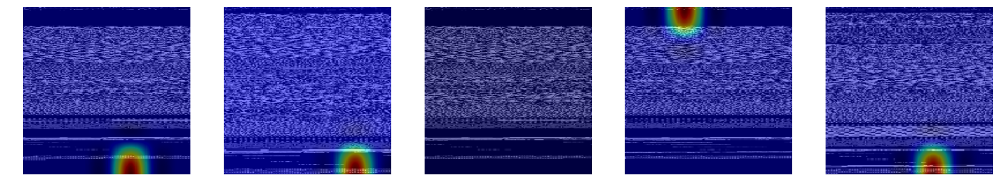

Family: Lolyda.AA3
Image: ['0038e74cba5cf1d5e93e2456275f9181.png'] - Class: ['Lolyda.AA3'] - Pred: 14 (Lolyda.AA3)
Image: ['00df632f4d455cebb677c74134afa2bd.png'] - Class: ['Lolyda.AA3'] - Pred: 14 (Lolyda.AA3)
Image: ['005b438811c6551f1010829646a32918.png'] - Class: ['Lolyda.AA3'] - Pred: 14 (Lolyda.AA3)
Image: ['002d0d4813f1e36134b670996a640bc5.png'] - Class: ['Lolyda.AA3'] - Pred: 14 (Lolyda.AA3)
Image: ['00a2ce83230740bc0505f1671d9e1aec.png'] - Class: ['Lolyda.AA3'] - Pred: 14 (Lolyda.AA3)


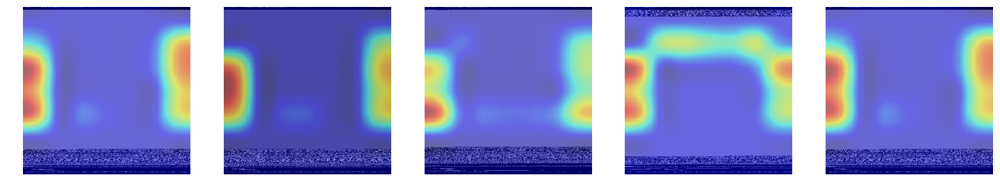

Family: Lolyda.AT
Image: ['00213079a689e4641cd289a2646c01c7.png'] - Class: ['Lolyda.AT'] - Pred: 15 (Lolyda.AT)
Image: ['005ba815f66dfdc0c3136861ad32b0e5.png'] - Class: ['Lolyda.AT'] - Pred: 15 (Lolyda.AT)
Image: ['067c868207fb1a58ce9657bda56befc6.png'] - Class: ['Lolyda.AT'] - Pred: 15 (Lolyda.AT)
Image: ['06579927c98dbf02738bf5927382eff7.png'] - Class: ['Lolyda.AT'] - Pred: 15 (Lolyda.AT)
Image: ['00029d8264accf77a44fc9e5f6523e0e.png'] - Class: ['Lolyda.AT'] - Pred: 15 (Lolyda.AT)


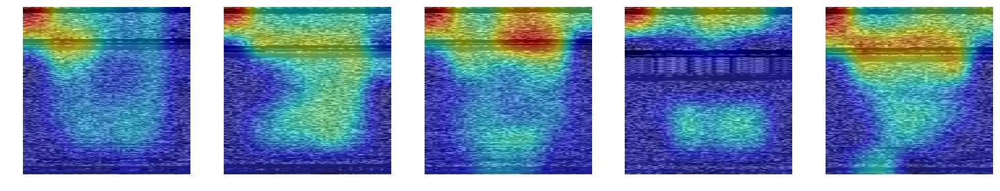

Family: Malex.gen!J
Image: ['007522a0b1f0946e717a23adad9f4135.png'] - Class: ['Malex.gen!J'] - Pred: 16 (Malex.gen!J)
Image: ['016e929e88b9470755d5b07eae697fae.png'] - Class: ['Malex.gen!J'] - Pred: 16 (Malex.gen!J)
Image: ['067d5fba10d28e4380241dd038faa81f.png'] - Class: ['Malex.gen!J'] - Pred: 16 (Malex.gen!J)
Image: ['06d16abd47fa46c93f9b1eb0d7dee7fb.png'] - Class: ['Malex.gen!J'] - Pred: 16 (Malex.gen!J)
Image: ['004dbb473dd76ad6a63ab690f9b1d299.png'] - Class: ['Malex.gen!J'] - Pred: 16 (Malex.gen!J)


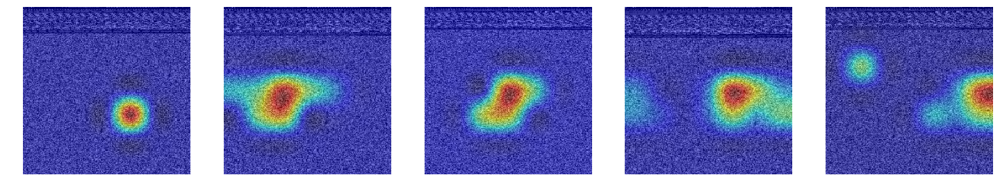

Family: Obfuscator.AD
Image: ['07a87ccc54c0f58a45eb03906ed8e817.png'] - Class: ['Obfuscator.AD'] - Pred: 17 (Obfuscator.AD)
Image: ['07465173a2aafd8a4d62b210f3b2aa6e.png'] - Class: ['Obfuscator.AD'] - Pred: 17 (Obfuscator.AD)
Image: ['06ee96f0f3b7fc8855a861d643b7a777.png'] - Class: ['Obfuscator.AD'] - Pred: 17 (Obfuscator.AD)
Image: ['035d9873dfca23f252a6c271e51a687b.png'] - Class: ['Obfuscator.AD'] - Pred: 17 (Obfuscator.AD)
Image: ['057d3715c300d9f23f0d1e93601c504f.png'] - Class: ['Obfuscator.AD'] - Pred: 17 (Obfuscator.AD)


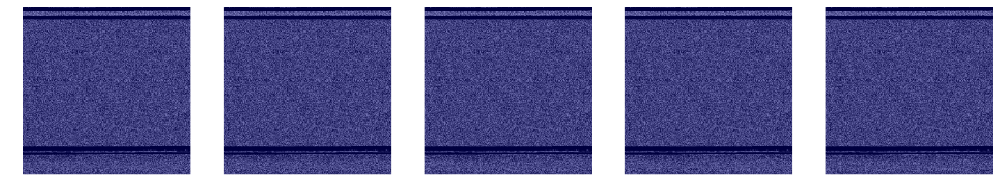

Family: Rbot!gen
Image: ['1c886124b0875b9efec1ce1887e3b87d.png'] - Class: ['Rbot!gen'] - Pred: 18 (Rbot!gen)
Image: ['bebfbb51f6807852aa0cc26b144a6a23.png'] - Class: ['Rbot!gen'] - Pred: 18 (Rbot!gen)
Image: ['cdea77e0f0acb42424eebaa48cd09147.png'] - Class: ['Rbot!gen'] - Pred: 18 (Rbot!gen)
Image: ['8c1a2ab433d0d4ea50b5e3ada0d85d08.png'] - Class: ['Rbot!gen'] - Pred: 18 (Rbot!gen)
Image: ['248a95d2266f4ff3f5dc6d9d0dd9aefe.png'] - Class: ['Rbot!gen'] - Pred: 18 (Rbot!gen)


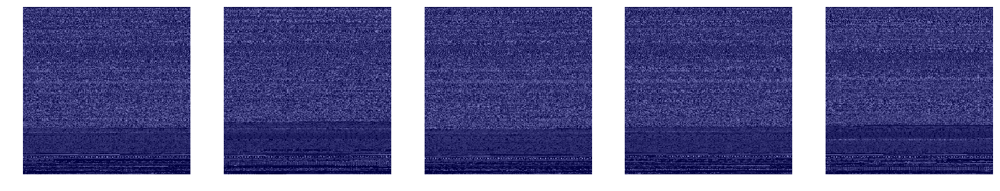

Family: Skintrim.N
Image: ['00e6a9a4a9610bc0bb98ac3a4f3fcef9.png'] - Class: ['Skintrim.N'] - Pred: 19 (Skintrim.N)
Image: ['0557c5c71c48f83242b13bded02d1dda.png'] - Class: ['Skintrim.N'] - Pred: 19 (Skintrim.N)
Image: ['003e1a34d9cd23cbde83764808b9f58c.png'] - Class: ['Skintrim.N'] - Pred: 19 (Skintrim.N)
Image: ['0008dc502d9aebae0ccb1a1bd5db74ce.png'] - Class: ['Skintrim.N'] - Pred: 19 (Skintrim.N)
Image: ['00068b80a394c325d25593d7c6c362df.png'] - Class: ['Skintrim.N'] - Pred: 19 (Skintrim.N)


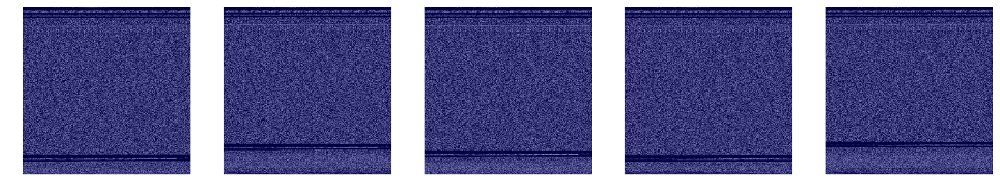

Family: Swizzor.gen!E
Image: ['062adb917a08b734288a533fe4a8085c.png'] - Class: ['Swizzor.gen!E'] - Pred: 21 (Swizzor.gen!I)
Image: ['05b75a552a6a9a6f4bf04f9494decf12.png'] - Class: ['Swizzor.gen!E'] - Pred: 20 (Swizzor.gen!E)
Image: ['0828267f550cc0a3dd22067ddb57f1c0.png'] - Class: ['Swizzor.gen!E'] - Pred: 20 (Swizzor.gen!E)
Image: ['0849a95894356011a262ee9d6de134fd.png'] - Class: ['Swizzor.gen!E'] - Pred: 20 (Swizzor.gen!E)
Image: ['03f04cbfae1d6c5e6b89442e9bf14e7e.png'] - Class: ['Swizzor.gen!E'] - Pred: 20 (Swizzor.gen!E)


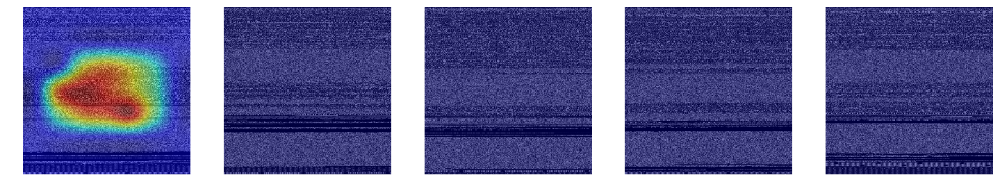

Family: Swizzor.gen!I
Image: ['006d14292350d9972e68b68329e853b8.png'] - Class: ['Swizzor.gen!I'] - Pred: 20 (Swizzor.gen!E)
Image: ['05d4ab2e9d830cfb211fcbab1243c82e.png'] - Class: ['Swizzor.gen!I'] - Pred: 20 (Swizzor.gen!E)
Image: ['04ea400082107d1b3cd9831f29cdc945.png'] - Class: ['Swizzor.gen!I'] - Pred: 21 (Swizzor.gen!I)
Image: ['00fdec29e4f91e2a4106e987d0457911.png'] - Class: ['Swizzor.gen!I'] - Pred: 21 (Swizzor.gen!I)
Image: ['0192c2bd1d8a7b713ab7bb7eb279e1e7.png'] - Class: ['Swizzor.gen!I'] - Pred: 21 (Swizzor.gen!I)


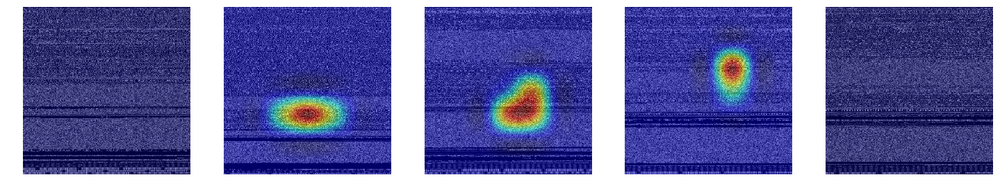

Family: VB.AT
Image: ['006f4f1ce04c5497c325bbe0f1ae8048.png'] - Class: ['VB.AT'] - Pred: 22 (VB.AT)
Image: ['057159488772fa607f7b83b3061d555b.png'] - Class: ['VB.AT'] - Pred: 22 (VB.AT)
Image: ['0491a74b7c9427b4e004f8eb41e55985.png'] - Class: ['VB.AT'] - Pred: 22 (VB.AT)
Image: ['035f43a82a737222bc0a401b6f0536c2.png'] - Class: ['VB.AT'] - Pred: 22 (VB.AT)
Image: ['0328c519ef608470d81fbdd859ef61de.png'] - Class: ['VB.AT'] - Pred: 22 (VB.AT)


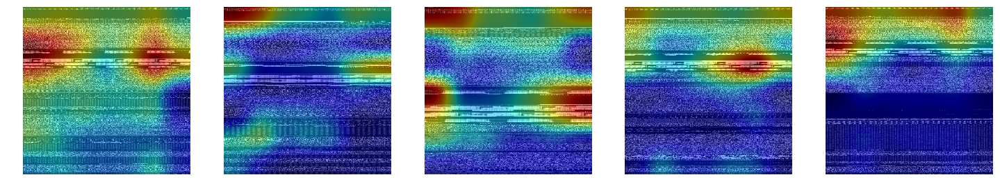

Family: Wintrim.BX
Image: ['001ebf3be2a1b457f3eb921b2da9bc41.png'] - Class: ['Wintrim.BX'] - Pred: 23 (Wintrim.BX)
Image: ['00071212d51d124c44530e4cff44806e.png'] - Class: ['Wintrim.BX'] - Pred: 23 (Wintrim.BX)
Image: ['008c914250c67525958154da3906d523.png'] - Class: ['Wintrim.BX'] - Pred: 23 (Wintrim.BX)
Image: ['002910579f8c6105e22edbe8ff47e3ae.png'] - Class: ['Wintrim.BX'] - Pred: 23 (Wintrim.BX)
Image: ['004f9127c0db4e1609462f32bc638afb.png'] - Class: ['Wintrim.BX'] - Pred: 23 (Wintrim.BX)


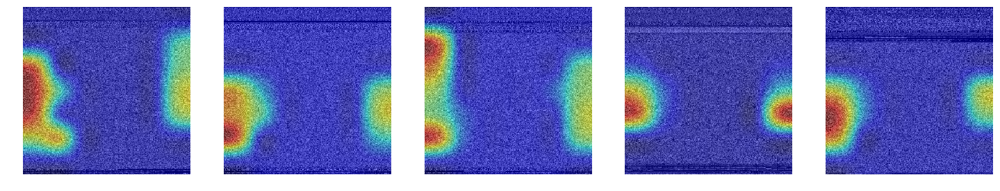

Family: Yuner.A
Image: ['00e18b54913bfa3889a9c22ea6302dfa.png'] - Class: ['Yuner.A'] - Pred: 24 (Yuner.A)
Image: ['04791814e8bbcd5c280bec34c388cc88.png'] - Class: ['Yuner.A'] - Pred: 24 (Yuner.A)
Image: ['05e716d2e00934776147cdd1bbe50dae.png'] - Class: ['Yuner.A'] - Pred: 24 (Yuner.A)
Image: ['043e735a4c382c13d45564f985753e2e.png'] - Class: ['Yuner.A'] - Pred: 24 (Yuner.A)
Image: ['08705fda714f21bc89b7b20d29afaa0f.png'] - Class: ['Yuner.A'] - Pred: 24 (Yuner.A)


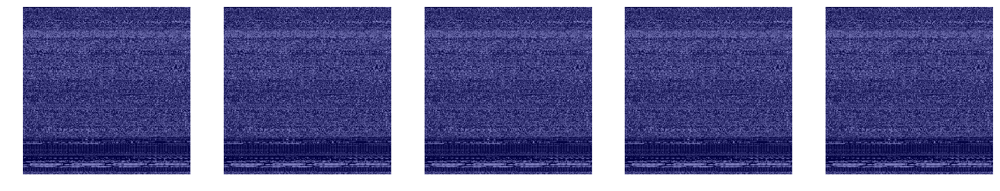

In [26]:
samplesbyfamily = 5 
for fam in list_fams:
    print("Family: %s" %(fam))
    fam_samples = [name for name in list_paths if fam in name]
    image_paths = random.sample(fam_samples, samplesbyfamily)
    
    f, ax = plt.subplots(1, samplesbyfamily)
    f.set_size_inches(25, 5)
    ind = 0
    
    for path in image_paths:
        # Predict the corresponding class for use in `visualize_cam`.
        img = io.imread(path)
        img = cv2.cvtColor(img,cv2.COLOR_GRAY2RGB)
        img = cv2.resize(img, (224, 224))
        pred_class = np.argmax(model.predict(np.array([img_to_array(img)])))
        print("Image: %s - Class: %s - Pred: %d (%s)" %(path.split('/')[-1:],path.split('/')[-2:-1],pred_class,list_fams[pred_class]))

        # Here we are asking it to show attention such that prob of `pred_class` is maximized.
        #heatmap = visualize_cam(model, layer_idx, [pred_class], seed_img, text=list_fams[pred_class])
        #heatmaps.append(heatmap)
        
        heatmap = visualize_cam(model, layer_idx, filter_indices=[pred_class], seed_input=img, backprop_modifier='guided')        
        ax[ind]
        ax[ind].axis('off')
        ax[ind].imshow(overlay(heatmap, img))
        ind = ind + 1
        
    plt.show()    